## 전처리

앞서 전처리 과정에서 이상치 건물을 확인  
다중공선성을 고려한 열 재설정

In [18]:
import os
import torch
import sys
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

pd.set_option('display.max_columns', 30)

In [19]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print('device :', device)
print('Current :', torch.cuda.current_device())
print('Count :', torch.cuda.device_count())

device : cuda
Current : 0
Count : 1


In [20]:
train = pd.read_csv('./data/train.csv')

In [21]:
## 변수 영문명으로 변경
cols = ['num_date_time','num', 'date_time', 'temp', 'prec','wind' ,'hum', 'hr', 'mj/m2', 'power']
train.columns = cols
train.head()

,num_date_time,num,date_time,temp,prec,wind,hum,hr,mj/m2,power
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [22]:
# train.csv 에만 있는 열 제거 num_date_time, hr, mj/m2
train = train.drop(['num_date_time','hr','mj/m2'], axis=1)
train.head()

,num,date_time,temp,prec,wind,hum,power
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40


In [23]:
train.isnull().sum()

num               0
date_time         0
temp              0
prec         160069
wind             19
hum               9
power             0
dtype: int64

In [24]:
# 강수량 결측치 0.0으로 채우기
train['prec'].fillna(0.0, inplace=True)

In [25]:
# wind, hum 결측치 보간법으로 채우기
train.wind = train.wind.interpolate(method = 'polynomial', order = 3)
train.hum = train.hum.interpolate(method = 'polynomial', order = 3)

In [26]:
train.isnull().sum()

num          0
date_time    0
temp         0
prec         0
wind         0
hum          0
power        0
dtype: int64

In [27]:
# 시간 관련 변수들 생성
# month 변수는 week 변수랑 상관계수가 0.9x로 나와서 제외함
train.date_time = pd.to_datetime(train.date_time)
train['hour'] = train.date_time.dt.hour
train['day'] = train.date_time.dt.weekday
train['week'] = train.date_time.dt.weekofyear
train.head()

/tmp/ipykernel_27344/3356464219.py:6: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train['week'] = train.date_time.dt.weekofyear


,num,date_time,temp,prec,wind,hum,power,hour,day,week
0,1,2022-06-01 00:00:00,18.6,0.0,0.9,42.0,1085.28,0,2,22
1,1,2022-06-01 01:00:00,18.0,0.0,1.1,45.0,1047.36,1,2,22
2,1,2022-06-01 02:00:00,17.7,0.0,1.5,45.0,974.88,2,2,22
3,1,2022-06-01 03:00:00,16.7,0.0,1.4,48.0,953.76,3,2,22
4,1,2022-06-01 04:00:00,18.4,0.0,2.8,43.0,986.40,4,2,22


34번 , 56번 이상치 확인 -- 어떻게??
이상치 보간법으로 값 대체

In [28]:
# fig = plt.figure(figsize = (15, 40))
# for num in train['num'].unique():
#     df = train[train.num == num]
#     df = df.groupby(['day', 'hour'])['power'].mean().reset_index().pivot('day', 'hour', 'power')
#     plt.subplot(20, 5, num)
#     sns.heatmap(df)
#     plt.title(f'building {num}')
#     plt.xlabel('')
#     plt.ylabel('')
#     plt.yticks([])
#     plt.xticks([])

# plt.show()

34번과 56번의 데이터를 각각 이상치로 판단, 시계열 데이터의 특성 고려 - pandas의 interpolation(보간법) 활용 이상치 채움

<Axes: xlabel='date_time', ylabel='power'>

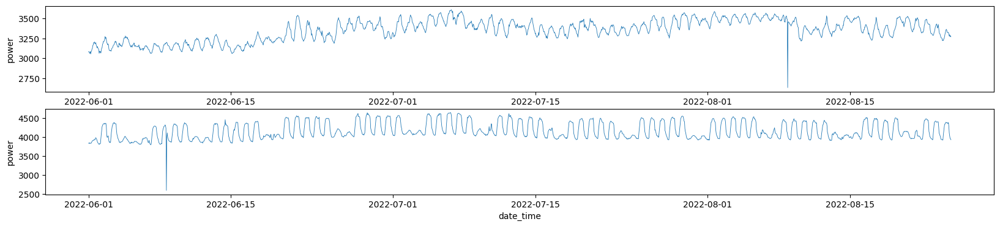

In [29]:
num_34 = train[train.num == 34]
num_56 = train[train.num == 56]

fig = plt.figure(figsize = (20,4))
plt.subplot(211)
sns.lineplot(data = num_34, x = 'date_time', y = 'power',linewidth = 0.6)
plt.subplot(212)
sns.lineplot(data = num_56, x = 'date_time', y = 'power',linewidth = 0.6)

In [30]:
#보간 이전 값
train.loc[(train.date_time == '2022-08-08 21:00:00')& (train.num == 34), 'power'],
train.loc[(train.date_time == '2022-06-08 16:00:00')& (train.num == 56), 'power']

112384    2589.84
Name: power, dtype: float64

In [31]:
train.loc[(train.date_time == '2022-08-08 21:00:00')& (train.num == 34), 'power'] = np.nan
train.loc[(train.date_time == '2022-06-08 16:00:00')& (train.num == 56), 'power'] = np.nan

In [32]:
#보간법 실행
train.power = train.power.interpolate(method = 'polynomial', order = 3)

In [33]:
#보간 이후 값
train.loc[(train.date_time == '2022-08-08 21:00:00')& (train.num == 34), 'power'],
train.loc[(train.date_time == '2022-06-08 16:00:00')& (train.num == 56), 'power']

112384    4065.2309
Name: power, dtype: float64

<Axes: xlabel='date_time', ylabel='power'>

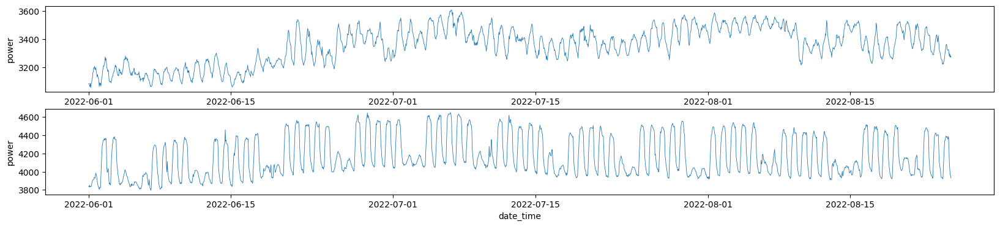

In [34]:
num_34 = train[train.num == 34]
num_56 = train[train.num == 56]

fig = plt.figure(figsize = (20,4))
plt.subplot(211)
sns.lineplot(data = num_34, x = 'date_time', y = 'power',linewidth = 0.6)
plt.subplot(212)
sns.lineplot(data = num_56, x = 'date_time', y = 'power',linewidth = 0.6)

In [35]:
train.head()

,num,date_time,temp,prec,wind,hum,power,hour,day,week
0,1,2022-06-01 00:00:00,18.6,0.0,0.9,42.0,1085.28,0,2,22
1,1,2022-06-01 01:00:00,18.0,0.0,1.1,45.0,1047.36,1,2,22
2,1,2022-06-01 02:00:00,17.7,0.0,1.5,45.0,974.88,2,2,22
3,1,2022-06-01 03:00:00,16.7,0.0,1.4,48.0,953.76,3,2,22
4,1,2022-06-01 04:00:00,18.4,0.0,2.8,43.0,986.40,4,2,22


In [36]:
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
power_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['day_hour_mean'] = train.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power'].values[0], axis = 1)

  0%|          | 0/204000 [00:00<?, ?it/s]

100%|██████████| 204000/204000 [03:55<00:00, 867.80it/s] 


In [37]:
# ## 건물별 시간별 발전량 평균 넣어주기 // day_hour_mean 이랑 상관계수가 0.9x 로 나와서 제외하는게 낫다고 판단
# power_hour_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
# train['hour_mean'] = train.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)
# train.head()

In [38]:
## 건물별 요일별 시간별 발전량 표준편차 넣어주기
power_hour_std = pd.pivot_table(train, values = 'power', index = ['num', 'hour', 'day'], aggfunc = np.std).reset_index()
tqdm.pandas()
train['day_hour_std'] = train.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) & (power_hour_std.day == x['day']) ,'power'].values[0], axis = 1)
train.head()


100%|██████████| 204000/204000 [03:57<00:00, 860.58it/s] 


,num,date_time,temp,prec,wind,hum,power,hour,day,week,day_hour_mean,day_hour_std
0,1,2022-06-01 00:00:00,18.6,0.0,0.9,42.0,1085.28,0,2,22,1774.744615,517.982222
1,1,2022-06-01 01:00:00,18.0,0.0,1.1,45.0,1047.36,1,2,22,1687.347692,500.769931
2,1,2022-06-01 02:00:00,17.7,0.0,1.5,45.0,974.88,2,2,22,1571.483077,465.227458
3,1,2022-06-01 03:00:00,16.7,0.0,1.4,48.0,953.76,3,2,22,1522.153846,436.601091
4,1,2022-06-01 04:00:00,18.4,0.0,2.8,43.0,986.40,4,2,22,1506.793846,405.518091


In [39]:
### 공휴일 변수 추가
### 공휴일이면 1 아니면 0
### 6월 1일, 6월 6일, 8월 15일 임시공휴일로 지정이므로 1로 변경
train['holiday'] = train.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train.loc[('2022-06-01'<=train.date_time)&(train.date_time<'2022-06-02'), 'holiday'] = 1
train.loc[('2022-06-06'<=train.date_time)&(train.date_time<'2022-06-07'), 'holiday'] = 1
train.loc[('2022-08-15'<=train.date_time)&(train.date_time<'2022-08-16'), 'holiday'] = 1

train.head()

,num,date_time,temp,prec,wind,hum,power,hour,day,week,day_hour_mean,day_hour_std,holiday
0,1,2022-06-01 00:00:00,18.6,0.0,0.9,42.0,1085.28,0,2,22,1774.744615,517.982222,1
1,1,2022-06-01 01:00:00,18.0,0.0,1.1,45.0,1047.36,1,2,22,1687.347692,500.769931,1
2,1,2022-06-01 02:00:00,17.7,0.0,1.5,45.0,974.88,2,2,22,1571.483077,465.227458,1
3,1,2022-06-01 03:00:00,16.7,0.0,1.4,48.0,953.76,3,2,22,1522.153846,436.601091,1
4,1,2022-06-01 04:00:00,18.4,0.0,2.8,43.0,986.40,4,2,22,1506.793846,405.518091,1


In [40]:
## 시간에 대한 이산푸리에변환 (DFT)
## 시간 변수 제거
train['sin_time'] = np.sin(2*np.pi*train.hour/24)
train['cos_time'] = np.cos(2*np.pi*train.hour/24)
train.drop(['hour'], axis = 1, inplace = True)

In [41]:
# 불쾌지수 변수 THI 추가
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32

In [42]:
def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-24))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-24))
    return np.array(ys)

cdhs = np.array([])
for num in range(1,101,1):
    temp = train[train['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
train['CDH'] = cdhs

In [43]:
train.head()

,num,date_time,temp,prec,wind,hum,power,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-06-01 00:00:00,18.6,0.0,0.9,42.0,1085.28,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4
1,1,2022-06-01 01:00:00,18.0,0.0,1.1,45.0,1047.36,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4
2,1,2022-06-01 02:00:00,17.7,0.0,1.5,45.0,974.88,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7
3,1,2022-06-01 03:00:00,16.7,0.0,1.4,48.0,953.76,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0
4,1,2022-06-01 04:00:00,18.4,0.0,2.8,43.0,986.40,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6


In [44]:
# 슬라이싱을 편하게 하기 위해 power 열을 temp 열과 바꿈
train = train[['num', 'date_time', 'power', 'prec', 'wind', 'hum', 'temp', 'day',
       'week', 'day_hour_mean', 'day_hour_std', 'holiday',
       'sin_time', 'cos_time', 'THI', 'CDH']]

train.head()

,num,date_time,power,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-06-01 00:00:00,1085.28,0.0,0.9,42.0,18.6,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4
1,1,2022-06-01 01:00:00,1047.36,0.0,1.1,45.0,18.0,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4
2,1,2022-06-01 02:00:00,974.88,0.0,1.5,45.0,17.7,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7
3,1,2022-06-01 03:00:00,953.76,0.0,1.4,48.0,16.7,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0
4,1,2022-06-01 04:00:00,986.40,0.0,2.8,43.0,18.4,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6


In [45]:
cor_mat = train.iloc[:, 3:].corr()
cor_mat

,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
prec,1.000000,0.048084,0.199561,-0.068643,-5.596441e-02,5.685267e-02,0.011426,0.013700,-6.791275e-02,-1.855866e-02,5.276106e-03,0.140489,-0.018544
wind,0.048084,1.000000,-0.219113,0.220234,-1.065748e-01,-4.052598e-02,0.113518,0.141961,-4.576878e-02,-2.337993e-01,-2.134326e-01,0.050594,0.085016
hum,0.199561,-0.219113,1.000000,-0.389889,-1.340273e-02,2.903782e-01,-0.152750,-0.142025,-9.386339e-02,3.663776e-01,3.370165e-01,0.312968,-0.043888
temp,-0.068643,0.220234,-0.389889,1.000000,4.288145e-02,4.369247e-01,0.120400,0.119990,4.276952e-02,-3.763837e-01,-3.376778e-01,0.664361,0.735419
day,-0.055964,-0.106575,-0.013403,0.042881,1.000000e+00,-1.108587e-01,-0.044112,-0.131632,6.766704e-01,1.234616e-18,1.342462e-18,0.025373,0.037345
week,0.056853,-0.040526,0.290378,0.436925,-1.108587e-01,1.000000e+00,0.003381,0.014014,-1.017061e-01,5.249918e-18,-1.014789e-18,0.574636,0.509565
day_hour_mean,0.011426,0.113518,-0.152750,0.120400,-4.411168e-02,3.380987e-03,1.000000,0.706724,-5.513656e-02,-1.053377e-01,-1.934393e-01,-0.006375,-0.000450
day_hour_std,0.013700,0.141961,-0.142025,0.119990,-1.316324e-01,1.401448e-02,0.706724,1.000000,-8.096020e-02,-9.647123e-02,-2.626936e-01,0.001986,-0.035407
holiday,-0.067913,-0.045769,-0.093863,0.042770,6.766704e-01,-1.017061e-01,-0.055137,-0.080960,1.000000e+00,8.265861e-22,-7.340085e-19,-0.005400,0.049732
sin_time,-0.018559,-0.233799,0.366378,-0.376384,1.234616e-18,5.249918e-18,-0.105338,-0.096471,8.265861e-22,1.000000e+00,-9.011310e-18,-0.086818,-0.282027


In [46]:
# plt.figure(figsize=(8, 6))
# sns.heatmap(cor_mat, annot=True, cmap='coolwarm', center=0)
# plt.title('독립변수들 간의 상관성 히트맵')
# plt.show()

In [47]:
## save the preprocessed data
train.to_csv('./data/xgboost/train_preprocessed2.csv')

## 모델링

In [48]:
import os
# import torch
import sys
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

pd.set_option('display.max_columns', 30)

In [49]:
# 전처리 한 파일 불러오기
train = pd.read_csv('./data/xgboost/train_preprocessed2.csv', index_col=0)
train.head()

,num,date_time,power,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-06-01 00:00:00,1085.28,0.0,0.9,42.0,18.6,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4
1,1,2022-06-01 01:00:00,1047.36,0.0,1.1,45.0,18.0,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4
2,1,2022-06-01 02:00:00,974.88,0.0,1.5,45.0,17.7,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7
3,1,2022-06-01 03:00:00,953.76,0.0,1.4,48.0,16.7,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0
4,1,2022-06-01 04:00:00,986.40,0.0,2.8,43.0,18.4,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6


### model tuning

In [3]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

In [34]:
from sklearn.model_selection import PredefinedSplit, GridSearchCV
from sklearn.metrics import make_scorer
smape = make_scorer(SMAPE, greater_is_better = False)

df = pd.read_csv('./data/xgboost/hyperparameter_xgb0815_2.csv')
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.03], 'min_child_weight' : np.arange(1, 8, 1),
        'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# 건물 번호별로 GridSearch로 parameter 생성
for i in tqdm(np.arange(38, 101)):
    y = train.loc[train.num == i, 'power']
    x = train.loc[train.num == i, ].iloc[:, 3:]
    # 마지막 일주일 발전량을 validset으로 24시간*7일 = 168
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)


    # pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed = 10, gpu_id = 0,
                                                tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
                       param_grid = grid, scoring = smape, cv = 5, refit = True, verbose = True)


    gcv.fit(x, y)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
    df.to_csv('./data/xgboost/hyperparameter_xgb0815_2.csv', index = False) # save the tuned parameters

  0%|          | 0/63 [00:00<?, ?it/s]

/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


Fitting 5 folds for each of 168 candidates, totalling 840 fits


  2%|▏         | 1/63 [09:00<9:18:42, 540.68s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
building38|| SMAPE : 3.0592289832883393
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
  3%|▎         | 2/63 [18:22<9:22:14, 553.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building39|| SMAPE : 3.0534762557571966
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
  5%|▍         | 3/63 [29:13<9:57:40, 597.68s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 4.297100677493741
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
  6%|▋         | 4/63 [39:36<9:57:32, 607.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 2.9295285638437387
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
  8%|▊         | 5/63 [49:09<9:35:17, 595.14s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building42|| SMAPE : 4.207758224187062
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 10%|▉         | 6/63 [58:53<9:21:57, 591.54s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 2.993797039859408
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 11%|█         | 7/63 [1:08:01<8:58:42, 577.19s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building44|| SMAPE : 2.18383307331317
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 13%|█▎        | 8/63 [1:16:04<8:21:45, 547.38s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 2.65133822972569
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 14%|█▍        | 9/63 [1:25:31<8:18:02, 553.38s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building46|| SMAPE : 2.876031268635211
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 16%|█▌        | 10/63 [1:33:52<7:54:34, 537.25s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building47|| SMAPE : 2.349792986536498
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 17%|█▋        | 11/63 [1:42:03<7:33:13, 522.96s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building48|| SMAPE : 2.5447078770720317
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 19%|█▉        | 12/63 [1:49:37<7:06:47, 502.11s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building49|| SMAPE : 2.813577082602718
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 21%|██        | 13/63 [1:57:20<6:48:37, 490.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 2.150973943403135
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 22%|██▏       | 14/63 [2:07:23<7:08:05, 524.19s/it]

{'colsample_bytree': 0.8, 'eta': 0.03, 'max_depth': 7, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building51|| SMAPE : 2.7080346928703083
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 24%|██▍       | 15/63 [2:17:41<7:22:07, 552.65s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building52|| SMAPE : 2.9104181910364537
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
 25%|██▌       | 16/63 [2:26:58<7:13:47, 553.77s/it]

{'colsample_bytree': 0.9, 'eta': 0.03, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building53|| SMAPE : 3.012882141931761
Fitting 5 folds for each of 168 candidates, totalling 840 fits


/home/mskang/.conda/envs/server/lib/python3.9/site-packages/xgboost/data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [12]:
xgb_params = pd.read_csv('./data/xgboost/hyperparameter_xgb0815_2.csv')

In [13]:
xgb_params

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample
0,100,0.03,5,5,0.9,0.8
1,100,0.03,1,4,0.9,0.9
2,100,0.03,4,5,0.8,0.9
3,100,0.03,2,4,0.9,0.8
4,100,0.03,3,8,0.8,0.8
...,...,...,...,...,...,...
95,100,0.03,2,5,0.8,0.8
96,100,0.03,4,7,0.8,0.8
97,100,0.03,4,4,0.9,0.8
98,100,0.03,1,6,0.8,0.8


In [16]:
train.head()

,num,date_time,power,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-06-01 00:00:00,1085.28,0.0,0.9,42.0,18.6,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4
1,1,2022-06-01 01:00:00,1047.36,0.0,1.1,45.0,18.0,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4
2,1,2022-06-01 02:00:00,974.88,0.0,1.5,45.0,17.7,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7
3,1,2022-06-01 03:00:00,953.76,0.0,1.4,48.0,16.7,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0
4,1,2022-06-01 04:00:00,986.40,0.0,2.8,43.0,18.4,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6


### 손실함수를 rmse 사용. weighted_mse 을 사용하는 것이 더 좋다고 판단

In [98]:
# # 평가지표로 rmse 사용
# scores = []   # smape 값을 저장할 list
# best_it = []  # best interation을 저장할 list
# for i in tqdm(range(100)):
#     y = train.loc[train.num == i+1, 'power']
#     x = train.loc[train.num == i+1, ].iloc[:, 3:]
#     y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
#     xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
#                            max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
#                            subsample = xgb_params.iloc[i, 5], seed=0, eval_metric = 'rmse')
#     xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
#     xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
#                                             (x_valid, y_valid)], early_stopping_rounds=100, verbose=False)
#     y_pred = xgb_reg.predict(x_valid)
#     pred = pd.Series(y_pred)   
    
#     sm = SMAPE(y_valid, y_pred)
#     scores.append(sm)
#     best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

  0%|          | 0/100 [00:00<?, ?it/s]

c:\Users\win\anaconda3\Lib\site-packages\xgboost\data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
100%|██████████| 100/100 [00:49<00:00,  2.00it/s]


In [ ]:
# smape_list = []
# for i in tqdm(range(100)):
#     y = train.loc[train.num == i+1, 'power']
#     x = train.loc[train.num == i+1, ].iloc[:, 3:]
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
#     xgb = XGBRegressor(seed = 0,
#                       n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
#                       max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5], eval_metric = 'rmse')
    
#     xgb.fit(x_train, y_train)
#     pred0 = xgb.predict(x_test)
#     score0 = SMAPE(y_test,pred0)

#     smape_list.append(score0)
#     print("building {} || best score : {}".format(i+1, score0))

In [ ]:
# smape_list

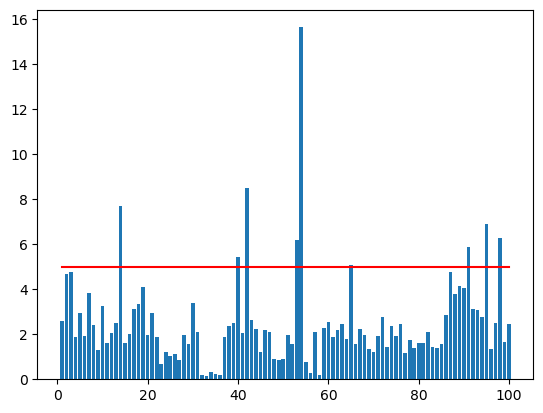

In [104]:
# no_df = pd.DataFrame({'score':smape_list})
# plt.bar(np.arange(len(no_df))+1, no_df['score'])
# plt.plot([1,100], [5, 5], color = 'red')

In [ ]:
# weighted_mse 쓰는것과 안쓰는 것 차이 확인
# weighted_mse 안쓰는 것이 더 점수 높게 나오네?? 둘다 실험해보자

scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 1000, eta = xgb_params.iloc[i, 1], min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=10)
    # xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.
    print("building {} || best iter : {} || smape : {}".format(i+1, xgb_reg.best_iteration, sm))

### 손실함수를 임의로 생성한 weighted_mse 사용
이 함수를 이용하는 것이 rmse 를 이용하는 것보다 smape 평가지표상에서 더 좋음

In [225]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

In [226]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=10)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

  0%|          | 0/100 [00:00<?, ?it/s]c:\Users\win\anaconda3\Lib\site-packages\xgboost\data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


### alpha tuning for weighted MSE

In [229]:
alpha_list = []
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 10,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in range(1, 100, 2):
        xgb = XGBRegressor(seed = 10,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  0%|          | 0/100 [00:00<?, ?it/s]c:\Users\win\anaconda3\Lib\site-packages\xgboost\data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
  1%|          | 1/100 [00:26<43:27, 26.33s/it]

building 1 || best score : 3.2376051488261415 || alpha : 3


  2%|▏         | 2/100 [00:45<36:02, 22.07s/it]

building 2 || best score : 5.09050734251195 || alpha : 9


  3%|▎         | 3/100 [01:00<30:39, 18.96s/it]

building 3 || best score : 4.960149170710621 || alpha : 3


  4%|▍         | 4/100 [01:24<33:15, 20.78s/it]

building 4 || best score : 1.8333083555969145 || alpha : 45


  5%|▌         | 5/100 [01:52<37:00, 23.37s/it]

building 5 || best score : 3.0690207146193487 || alpha : 13


  6%|▌         | 6/100 [02:26<42:28, 27.11s/it]

building 6 || best score : 1.6180545901605343 || alpha : 85


  7%|▋         | 7/100 [02:48<39:18, 25.36s/it]

building 7 || best score : 4.3518332474427135 || alpha : 0


  8%|▊         | 8/100 [03:16<40:26, 26.38s/it]

building 8 || best score : 2.4400534283044757 || alpha : 91


  9%|▉         | 9/100 [03:45<41:08, 27.12s/it]

building 9 || best score : 1.3725445365171185 || alpha : 9


 10%|█         | 10/100 [04:05<37:22, 24.92s/it]

building 10 || best score : 3.2326943149211362 || alpha : 3


 11%|█         | 11/100 [04:34<38:54, 26.23s/it]

building 11 || best score : 1.4766369355118345 || alpha : 41


 12%|█▏        | 12/100 [05:06<40:59, 27.95s/it]

building 12 || best score : 2.1825243378840646 || alpha : 5


 13%|█▎        | 13/100 [05:33<40:04, 27.63s/it]

building 13 || best score : 2.3241579690720195 || alpha : 27


 14%|█▍        | 14/100 [05:49<34:38, 24.17s/it]

building 14 || best score : 7.774535458911501 || alpha : 9


 15%|█▌        | 15/100 [06:17<35:38, 25.15s/it]

building 15 || best score : 1.5226868476012037 || alpha : 51


 16%|█▌        | 16/100 [06:39<34:00, 24.29s/it]

building 16 || best score : 2.0775589102612195 || alpha : 0


 17%|█▋        | 17/100 [07:07<35:12, 25.45s/it]

building 17 || best score : 3.0057013792556875 || alpha : 17


 18%|█▊        | 18/100 [07:37<36:33, 26.75s/it]

building 18 || best score : 3.6013624776185216 || alpha : 1


 19%|█▉        | 19/100 [08:15<40:44, 30.18s/it]

building 19 || best score : 3.9832700455977332 || alpha : 5


 20%|██        | 20/100 [08:48<41:26, 31.08s/it]

building 20 || best score : 2.0989702420376495 || alpha : 7


 21%|██        | 21/100 [09:16<39:29, 29.99s/it]

building 21 || best score : 3.133255451666095 || alpha : 1


 22%|██▏       | 22/100 [09:46<38:54, 29.93s/it]

building 22 || best score : 1.8572472236058026 || alpha : 3


 23%|██▎       | 23/100 [10:20<40:01, 31.18s/it]

building 23 || best score : 0.8143127315338287 || alpha : 3


 24%|██▍       | 24/100 [10:54<40:39, 32.10s/it]

building 24 || best score : 1.0575753397995054 || alpha : 95


 25%|██▌       | 25/100 [11:34<43:14, 34.59s/it]

building 25 || best score : 1.0311866435881258 || alpha : 23


 26%|██▌       | 26/100 [12:03<40:25, 32.77s/it]

building 26 || best score : 1.0891752576723526 || alpha : 73


 27%|██▋       | 27/100 [12:31<38:10, 31.37s/it]

building 27 || best score : 0.879667368338032 || alpha : 47


 28%|██▊       | 28/100 [12:50<33:18, 27.76s/it]

building 28 || best score : 2.0020693452783704 || alpha : 1


 29%|██▉       | 29/100 [13:17<32:23, 27.37s/it]

building 29 || best score : 1.7421904470876444 || alpha : 0


 30%|███       | 30/100 [13:41<30:53, 26.49s/it]

building 30 || best score : 3.902864972121271 || alpha : 3


 31%|███       | 31/100 [14:03<28:43, 24.98s/it]

building 31 || best score : 2.1121928592179917 || alpha : 0


 32%|███▏      | 32/100 [14:48<35:13, 31.07s/it]

building 32 || best score : 0.21706680381389384 || alpha : 1


 33%|███▎      | 33/100 [15:37<40:36, 36.36s/it]

building 33 || best score : 0.17147781593237116 || alpha : 0


 34%|███▍      | 34/100 [16:21<42:45, 38.87s/it]

building 34 || best score : 0.3183538479345318 || alpha : 63


 35%|███▌      | 35/100 [17:10<45:14, 41.77s/it]

building 35 || best score : 0.2123235963714908 || alpha : 55


 36%|███▌      | 36/100 [18:06<49:13, 46.15s/it]

building 36 || best score : 0.18739211796450594 || alpha : 39


 37%|███▋      | 37/100 [18:35<42:57, 40.92s/it]

building 37 || best score : 1.8183285661898962 || alpha : 13


 38%|███▊      | 38/100 [19:04<38:39, 37.41s/it]

building 38 || best score : 2.143680908667831 || alpha : 3


 39%|███▉      | 39/100 [19:38<36:55, 36.33s/it]

building 39 || best score : 1.9398661418730072 || alpha : 25


 40%|████      | 40/100 [19:59<31:44, 31.74s/it]

building 40 || best score : 4.658719468581057 || alpha : 23


 41%|████      | 41/100 [20:30<30:52, 31.40s/it]

building 41 || best score : 2.0906613428872185 || alpha : 7


 42%|████▏     | 42/100 [20:47<26:15, 27.17s/it]

building 42 || best score : 8.503725890558329 || alpha : 1


 43%|████▎     | 43/100 [21:17<26:44, 28.16s/it]

building 43 || best score : 2.857293657848617 || alpha : 0


 44%|████▍     | 44/100 [21:44<25:54, 27.76s/it]

building 44 || best score : 2.186143348834142 || alpha : 1


 45%|████▌     | 45/100 [22:20<27:32, 30.05s/it]

building 45 || best score : 1.0859429599110368 || alpha : 93


 46%|████▌     | 46/100 [22:46<26:06, 29.01s/it]

building 46 || best score : 2.181673600700839 || alpha : 41


 47%|████▋     | 47/100 [23:12<24:45, 28.02s/it]

building 47 || best score : 2.11661593719768 || alpha : 1


 48%|████▊     | 48/100 [23:44<25:24, 29.32s/it]

building 48 || best score : 1.0484821346056659 || alpha : 3


 49%|████▉     | 49/100 [24:19<26:19, 30.98s/it]

building 49 || best score : 0.928809848276258 || alpha : 15


 50%|█████     | 50/100 [24:47<24:56, 29.93s/it]

building 50 || best score : 0.786449493709308 || alpha : 19


 51%|█████     | 51/100 [25:20<25:16, 30.94s/it]

building 51 || best score : 1.7407916024491459 || alpha : 15


 52%|█████▏    | 52/100 [25:58<26:30, 33.13s/it]

building 52 || best score : 1.4062828093116349 || alpha : 9


 53%|█████▎    | 53/100 [26:17<22:40, 28.94s/it]

building 53 || best score : 6.018737672135355 || alpha : 0


 54%|█████▍    | 54/100 [26:44<21:44, 28.35s/it]

building 54 || best score : 11.4294280777652 || alpha : 99


 55%|█████▌    | 55/100 [27:21<23:12, 30.94s/it]

building 55 || best score : 0.7431490223860797 || alpha : 5


 56%|█████▌    | 56/100 [28:03<25:10, 34.32s/it]

building 56 || best score : 0.32150554280318244 || alpha : 97


 57%|█████▋    | 57/100 [28:32<23:15, 32.45s/it]

building 57 || best score : 2.223308205078574 || alpha : 3


 58%|█████▊    | 58/100 [29:16<25:16, 36.10s/it]

building 58 || best score : 0.1905284843872976 || alpha : 3


 59%|█████▉    | 59/100 [29:43<22:44, 33.29s/it]

building 59 || best score : 2.3634223623892954 || alpha : 0


 60%|██████    | 60/100 [30:07<20:21, 30.54s/it]

building 60 || best score : 2.594328966047915 || alpha : 17


 61%|██████    | 61/100 [30:32<18:51, 29.01s/it]

building 61 || best score : 1.909882064942405 || alpha : 77


 62%|██████▏   | 62/100 [30:58<17:40, 27.91s/it]

building 62 || best score : 2.187567758268409 || alpha : 7


 63%|██████▎   | 63/100 [31:20<16:10, 26.23s/it]

building 63 || best score : 2.5278776016372717 || alpha : 1


 64%|██████▍   | 64/100 [31:47<15:47, 26.31s/it]

building 64 || best score : 1.8075601692475283 || alpha : 7


 65%|██████▌   | 65/100 [32:06<14:12, 24.35s/it]

building 65 || best score : 4.855692223775205 || alpha : 3


 66%|██████▌   | 66/100 [32:39<15:09, 26.75s/it]

building 66 || best score : 1.7182094354775552 || alpha : 39


 67%|██████▋   | 67/100 [32:57<13:14, 24.09s/it]

building 67 || best score : 2.2602277615942548 || alpha : 0


 68%|██████▊   | 68/100 [33:21<12:54, 24.21s/it]

building 68 || best score : 1.89547258034399 || alpha : 3


 69%|██████▉   | 69/100 [33:48<12:53, 24.95s/it]

building 69 || best score : 1.416929143636968 || alpha : 7


 70%|███████   | 70/100 [34:25<14:18, 28.62s/it]

building 70 || best score : 1.1906807889174431 || alpha : 95


 71%|███████   | 71/100 [34:53<13:44, 28.41s/it]

building 71 || best score : 1.7441880350035073 || alpha : 7


 72%|███████▏  | 72/100 [35:30<14:25, 30.91s/it]

building 72 || best score : 1.9986901111222133 || alpha : 77


 73%|███████▎  | 73/100 [35:57<13:29, 29.99s/it]

building 73 || best score : 1.4188028052204542 || alpha : 0


 74%|███████▍  | 74/100 [36:28<13:06, 30.24s/it]

building 74 || best score : 2.2683204593455324 || alpha : 19


 75%|███████▌  | 75/100 [36:57<12:26, 29.84s/it]

building 75 || best score : 1.842969845227663 || alpha : 19


 76%|███████▌  | 76/100 [37:25<11:38, 29.12s/it]

building 76 || best score : 2.4973034237286886 || alpha : 99


 77%|███████▋  | 77/100 [37:57<11:34, 30.20s/it]

building 77 || best score : 1.2898773498489458 || alpha : 5


 78%|███████▊  | 78/100 [38:32<11:36, 31.66s/it]

building 78 || best score : 1.727846324526436 || alpha : 43


 79%|███████▉  | 79/100 [39:08<11:31, 32.93s/it]

building 79 || best score : 0.9381917946308348 || alpha : 61


 80%|████████  | 80/100 [39:43<11:10, 33.55s/it]

building 80 || best score : 1.6620587768472477 || alpha : 41


 81%|████████  | 81/100 [40:14<10:18, 32.56s/it]

building 81 || best score : 1.6963854781164085 || alpha : 3


 82%|████████▏ | 82/100 [40:41<09:19, 31.07s/it]

building 82 || best score : 2.084813949618445 || alpha : 5


 83%|████████▎ | 83/100 [41:13<08:51, 31.24s/it]

building 83 || best score : 1.433834389353938 || alpha : 93


 84%|████████▍ | 84/100 [41:42<08:11, 30.72s/it]

building 84 || best score : 1.433666506861083 || alpha : 97


 85%|████████▌ | 85/100 [42:21<08:18, 33.27s/it]

building 85 || best score : 1.5546685600417376 || alpha : 9


 86%|████████▌ | 86/100 [42:53<07:38, 32.76s/it]

building 86 || best score : 2.187251446874596 || alpha : 15


 87%|████████▋ | 87/100 [43:21<06:46, 31.26s/it]

building 87 || best score : 3.9121150350618845 || alpha : 85


 88%|████████▊ | 88/100 [44:00<06:43, 33.60s/it]

building 88 || best score : 3.2405209192616726 || alpha : 7


 89%|████████▉ | 89/100 [44:31<05:59, 32.71s/it]

building 89 || best score : 2.44096165626263 || alpha : 7


 90%|█████████ | 90/100 [44:59<05:13, 31.39s/it]

building 90 || best score : 2.535117416167006 || alpha : 9


 91%|█████████ | 91/100 [45:27<04:35, 30.56s/it]

building 91 || best score : 5.9600275115821635 || alpha : 3


 92%|█████████▏| 92/100 [45:53<03:51, 28.94s/it]

building 92 || best score : 2.597305473411694 || alpha : 75


 93%|█████████▎| 93/100 [46:25<03:29, 30.00s/it]

building 93 || best score : 3.1514082089085793 || alpha : 5


 94%|█████████▍| 94/100 [46:55<02:59, 29.94s/it]

building 94 || best score : 3.005860811355742 || alpha : 3


 95%|█████████▌| 95/100 [47:11<02:08, 25.69s/it]

building 95 || best score : 6.787480089678284 || alpha : 1


 96%|█████████▌| 96/100 [47:36<01:42, 25.50s/it]

building 96 || best score : 1.3531484157153248 || alpha : 0


 97%|█████████▋| 97/100 [48:14<01:28, 29.43s/it]

building 97 || best score : 2.333913064462947 || alpha : 39


 98%|█████████▊| 98/100 [48:35<00:53, 26.86s/it]

building 98 || best score : 6.307905942746037 || alpha : 1


 99%|█████████▉| 99/100 [49:03<00:27, 27.17s/it]

building 99 || best score : 1.648214492587342 || alpha : 1


100%|██████████| 100/100 [49:33<00:00, 29.73s/it]

building 100 || best score : 2.3655129104094494 || alpha : 11


In [230]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.to_csv('./data/xgboost/hyperparameter_xgb2_final.csv', index=False)

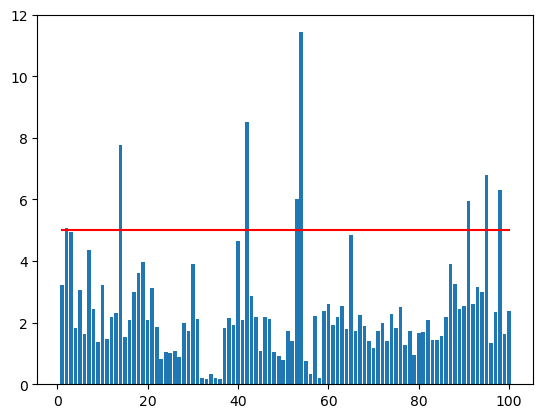

In [231]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [5, 5], color = 'red')

In [ ]:
# 여기까지 돌렸음..

In [232]:
xgb_params

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,3,0.8,0.8,3,357
1,100,0.01,7,3,0.8,0.8,9,255
2,100,0.01,7,3,0.9,0.9,3,203
3,100,0.01,1,3,0.9,0.9,45,323
4,100,0.01,5,3,0.8,0.9,13,387
...,...,...,...,...,...,...,...,...
95,100,0.01,1,3,0.8,0.9,0,343
96,100,0.01,3,3,0.8,0.9,39,530
97,100,0.01,1,3,0.8,0.9,1,284
98,100,0.01,1,3,0.9,0.9,1,379


## 4. test preprocessing

In [50]:
test = pd.read_csv('./data/test.csv')

In [51]:
cols = ['num_date_time','num', 'date_time', 'temp', 'prec','wind' ,'hum']
test.columns = cols

In [52]:
test.isnull().sum()

num_date_time    0
num              0
date_time        0
temp             0
prec             0
wind             0
hum              0
dtype: int64

In [53]:
test.drop(['num_date_time'], axis = 1, inplace = True)

In [54]:
test.head()

,num,date_time,temp,prec,wind,hum
0,1,20220825 00,23.5,0.0,2.2,72
1,1,20220825 01,23.0,0.0,0.9,72
2,1,20220825 02,22.7,0.0,1.5,75
3,1,20220825 03,22.1,0.0,1.3,78
4,1,20220825 04,21.8,0.0,1.0,77


In [55]:
# 시간 관련 변수들 생성
test.date_time = pd.to_datetime(test.date_time)
test['hour'] = test.date_time.dt.hour
test['day'] = test.date_time.dt.weekday
test['week'] = test.date_time.dt.weekofyear
test.head()

/tmp/ipykernel_27344/3639925981.py:5: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test['week'] = test.date_time.dt.weekofyear


,num,date_time,temp,prec,wind,hum,hour,day,week
0,1,2022-08-25 00:00:00,23.5,0.0,2.2,72,0,3,34
1,1,2022-08-25 01:00:00,23.0,0.0,0.9,72,1,3,34
2,1,2022-08-25 02:00:00,22.7,0.0,1.5,75,2,3,34
3,1,2022-08-25 03:00:00,22.1,0.0,1.3,78,3,3,34
4,1,2022-08-25 04:00:00,21.8,0.0,1.0,77,4,3,34


In [56]:
## 건물별 시간별 발전량 표준편차 넣어주기
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
## train 전처리 시 정의한 power_mean, power_hour_std 사용
tqdm.pandas()
test['day_hour_mean'] = test.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power'].values[0], axis = 1)
tqdm.pandas()
test['day_hour_std'] = test.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) & (power_hour_std.day == x['day']) ,'power'].values[0], axis = 1)
test.head()

100%|██████████| 16800/16800 [00:20<00:00, 829.49it/s]


,num,date_time,temp,prec,wind,hum,hour,day,week,day_hour_mean,day_hour_std
0,1,2022-08-25 00:00:00,23.5,0.0,2.2,72,0,3,34,1627.80,446.984913
1,1,2022-08-25 01:00:00,23.0,0.0,0.9,72,1,3,34,1550.08,449.091398
2,1,2022-08-25 02:00:00,22.7,0.0,1.5,75,2,3,34,1431.12,415.453568
3,1,2022-08-25 03:00:00,22.1,0.0,1.3,78,3,3,34,1372.20,378.117772
4,1,2022-08-25 04:00:00,21.8,0.0,1.0,77,4,3,34,1381.72,360.348483


In [57]:
### 공휴일 변수 추가
test['holiday'] = test.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)

In [58]:
## 시간에 대한 이산푸리에변환 (DFT)
## 시간 변수 제거
test['sin_time'] = np.sin(2*np.pi*test.hour/24)
test['cos_time'] = np.cos(2*np.pi*test.hour/24)
test.drop(['hour'], axis = 1, inplace = True)

In [59]:
# 불쾌지수 변수 THI 추가
test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

In [60]:
def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-24))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-24))
    return np.array(ys)

cdhs = np.array([])
for num in range(1,101,1):
    temp = test[test['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
test['CDH'] = cdhs

In [61]:
# 슬라이싱을 train 과 똑같이 바꿈
test = test[['num', 'date_time', 'prec', 'wind', 'hum', 'temp', 'day',
       'week', 'day_hour_mean', 'day_hour_std', 'holiday',
       'sin_time', 'cos_time', 'THI', 'CDH']]

In [62]:
test.head()

,num,date_time,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-08-25 00:00:00,0.0,2.2,72,23.5,3,34,1627.80,446.984913,0,0.000000,1.000000,58.3456,-0.5
1,1,2022-08-25 01:00:00,0.0,0.9,72,23.0,3,34,1550.08,449.091398,0,0.258819,0.965926,57.4456,-1.5
2,1,2022-08-25 02:00:00,0.0,1.5,75,22.7,3,34,1431.12,415.453568,0,0.500000,0.866025,57.8725,-2.8
3,1,2022-08-25 03:00:00,0.0,1.3,78,22.1,3,34,1372.20,378.117772,0,0.707107,0.707107,57.9376,-4.7
4,1,2022-08-25 04:00:00,0.0,1.0,77,21.8,3,34,1381.72,360.348483,0,0.866025,0.500000,56.9961,-6.9


In [64]:
test.to_csv('./data/xgboost/test_preprocessed.csv')

In [247]:
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,3,0.8,0.8,3,357
1,100,0.01,7,3,0.8,0.8,9,255
2,100,0.01,7,3,0.9,0.9,3,203
3,100,0.01,1,3,0.9,0.9,45,323
4,100,0.01,5,3,0.8,0.9,13,387


In [132]:
## best hyperparameters 불러오기
xgb_params = pd.read_csv('./data/xgboost/hyperparameter_xgb2_final.csv')

### 예측

In [249]:
test.head()

,num,date_time,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-08-25 00:00:00,0.0,2.2,72,23.5,3,34,1627.80,446.984913,0,0.000000,1.000000,58.3456,-0.5
1,1,2022-08-25 01:00:00,0.0,0.9,72,23.0,3,34,1550.08,449.091398,0,0.258819,0.965926,57.4456,-1.5
2,1,2022-08-25 02:00:00,0.0,1.5,75,22.7,3,34,1431.12,415.453568,0,0.500000,0.866025,57.8725,-2.8
3,1,2022-08-25 03:00:00,0.0,1.3,78,22.1,3,34,1372.20,378.117772,0,0.707107,0.707107,57.9376,-4.7
4,1,2022-08-25 04:00:00,0.0,1.0,77,21.8,3,34,1381.72,360.348483,0,0.866025,0.500000,56.9961,-6.9


In [250]:
train.head()

,num,date_time,power,prec,wind,hum,temp,day,week,day_hour_mean,day_hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2022-06-01 00:00:00,1085.28,0.0,0.9,42.0,18.6,2,22,1774.744615,517.982222,1,0.000000,1.000000,49.6576,-5.4
1,1,2022-06-01 01:00:00,1047.36,0.0,1.1,45.0,18.0,2,22,1687.347692,500.769931,1,0.258819,0.965926,47.7625,-11.4
2,1,2022-06-01 02:00:00,974.88,0.0,1.5,45.0,17.7,2,22,1571.483077,465.227458,1,0.500000,0.866025,47.2225,-17.7
3,1,2022-06-01 03:00:00,953.76,0.0,1.4,48.0,16.7,2,22,1522.153846,436.601091,1,0.707107,0.707107,44.7856,-25.0
4,1,2022-06-01 04:00:00,986.40,0.0,2.8,43.0,18.4,2,22,1506.793846,405.518091,1,0.866025,0.500000,49.0061,-30.6


In [251]:
xgb_params

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,3,0.8,0.8,3,357
1,100,0.01,7,3,0.8,0.8,9,255
2,100,0.01,7,3,0.9,0.9,3,203
3,100,0.01,1,3,0.9,0.9,45,323
4,100,0.01,5,3,0.8,0.9,13,387
...,...,...,...,...,...,...,...,...
95,100,0.01,1,3,0.8,0.9,0,343
96,100,0.01,3,3,0.8,0.9,39,530
97,100,0.01,1,3,0.8,0.9,1,284
98,100,0.01,1,3,0.9,0.9,1,379


In [252]:
preds = np.array([]) 
for i in tqdm(range(100)):
    
    y_train = train.loc[train.num == i+1, 'power']
    x_train, x_test = train.loc[train.num == i+1, ].iloc[:, 3:], test.loc[test.num == i+1, ].iloc[:,2:]
    x_test = x_test[x_train.columns]
    
    xgb = XGBRegressor(seed = 10, n_estimators = xgb_params.iloc[i, -1], eta = xgb_params.iloc[i, 1], 
                        min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                        colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])

    if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
        xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
    
    xgb.fit(x_train, y_train)
    y_pred = xgb.predict(x_test)
    preds = np.append(preds, y_pred)   

  0%|          | 0/100 [00:00<?, ?it/s]c:\Users\win\anaconda3\Lib\site-packages\xgboost\data.py:173: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
100%|██████████| 100/100 [00:59<00:00,  1.67it/s]


In [255]:
# 예측 결과 시각화

preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.num == i+1, 'power'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.num == i+1, 'power'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

In [256]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./data/xgboost/submission_xgb2_noclip.csv', index = False)